In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from ydata_profiling import ProfileReport
from sklearn.preprocessing import PolynomialFeatures, MinMaxScaler
from scipy.stats import skew
%matplotlib inline

In [2]:
# Input Data
df_train = pd.read_csv("../data/raw/train.csv")

In [3]:
df_train.head()

,id,RhythmScore,AudioLoudness,VocalContent,AcousticQuality,InstrumentalScore,LivePerformanceLikelihood,MoodScore,TrackDurationMs,Energy,BeatsPerMinute
0,0,0.603610,-7.636942,0.023500,0.000005,0.000001,0.051385,0.409866,290715.6450,0.826267,147.53020
1,1,0.639451,-16.267598,0.071520,0.444929,0.349414,0.170522,0.651010,164519.5174,0.145400,136.15963
2,2,0.514538,-15.953575,0.110715,0.173699,0.453814,0.029576,0.423865,174495.5667,0.624667,55.31989
3,3,0.734463,-1.357000,0.052965,0.001651,0.159717,0.086366,0.278745,225567.4651,0.487467,147.91212
4,4,0.532968,-13.056437,0.023500,0.068687,0.000001,0.331345,0.477769,213960.6789,0.947333,89.58511


In [4]:
df_train.shape

(524164, 11)

In [5]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 524164 entries, 0 to 524163
Data columns (total 11 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   id                         524164 non-null  int64  
 1   RhythmScore                524164 non-null  float64
 2   AudioLoudness              524164 non-null  float64
 3   VocalContent               524164 non-null  float64
 4   AcousticQuality            524164 non-null  float64
 5   InstrumentalScore          524164 non-null  float64
 6   LivePerformanceLikelihood  524164 non-null  float64
 7   MoodScore                  524164 non-null  float64
 8   TrackDurationMs            524164 non-null  float64
 9   Energy                     524164 non-null  float64
 10  BeatsPerMinute             524164 non-null  float64
dtypes: float64(10), int64(1)
memory usage: 44.0 MB


In [6]:
len(df_train[df_train.duplicated()])

0

In [7]:
df_train[df_train.duplicated()]

,id,RhythmScore,AudioLoudness,VocalContent,AcousticQuality,InstrumentalScore,LivePerformanceLikelihood,MoodScore,TrackDurationMs,Energy,BeatsPerMinute


In [8]:
df_train.isna().sum()

id                           0
RhythmScore                  0
AudioLoudness                0
VocalContent                 0
AcousticQuality              0
InstrumentalScore            0
LivePerformanceLikelihood    0
MoodScore                    0
TrackDurationMs              0
Energy                       0
BeatsPerMinute               0
dtype: int64

In [9]:
df_train.isna().sum().sum()

np.int64(0)

In [10]:
round(df_train.isna().sum().sum() / df_train.size * 100, 1)

np.float64(0.0)

In [11]:
#this function would be more helpful if there were any categorical features
df_train.nunique()

id                           524164
RhythmScore                  322528
AudioLoudness                310411
VocalContent                 229305
AcousticQuality              270478
InstrumentalScore            218979
LivePerformanceLikelihood    279591
MoodScore                    306504
TrackDurationMs              377442
Energy                        11606
BeatsPerMinute                14622
dtype: int64

In [12]:
df_train.describe()

,id,RhythmScore,AudioLoudness,VocalContent,AcousticQuality,InstrumentalScore,LivePerformanceLikelihood,MoodScore,TrackDurationMs,Energy,BeatsPerMinute
count,524164.000000,524164.000000,524164.000000,524164.000000,524164.000000,524164.000000,524164.000000,524164.000000,524164.000000,524164.000000,524164.000000
mean,262081.500000,0.632843,-8.379014,0.074443,0.262913,0.117690,0.178398,0.555843,241903.692949,0.500923,119.034899
std,151313.257587,0.156899,4.616221,0.049939,0.223120,0.131845,0.118186,0.225480,59326.601501,0.289952,26.468077
min,0.000000,0.076900,-27.509725,0.023500,0.000005,0.000001,0.024300,0.025600,63973.000000,0.000067,46.718000
25%,131040.750000,0.515850,-11.551933,0.023500,0.069413,0.000001,0.077637,0.403921,207099.876625,0.254933,101.070410
50%,262081.500000,0.634686,-8.252499,0.066425,0.242502,0.074247,0.166327,0.564817,243684.058150,0.511800,118.747660
75%,393122.250000,0.739179,-4.912298,0.107343,0.396957,0.204065,0.268946,0.716633,281851.658500,0.746000,136.686590
max,524163.000000,0.975000,-1.357000,0.256401,0.995000,0.869258,0.599924,0.978000,464723.228100,1.000000,206.037000


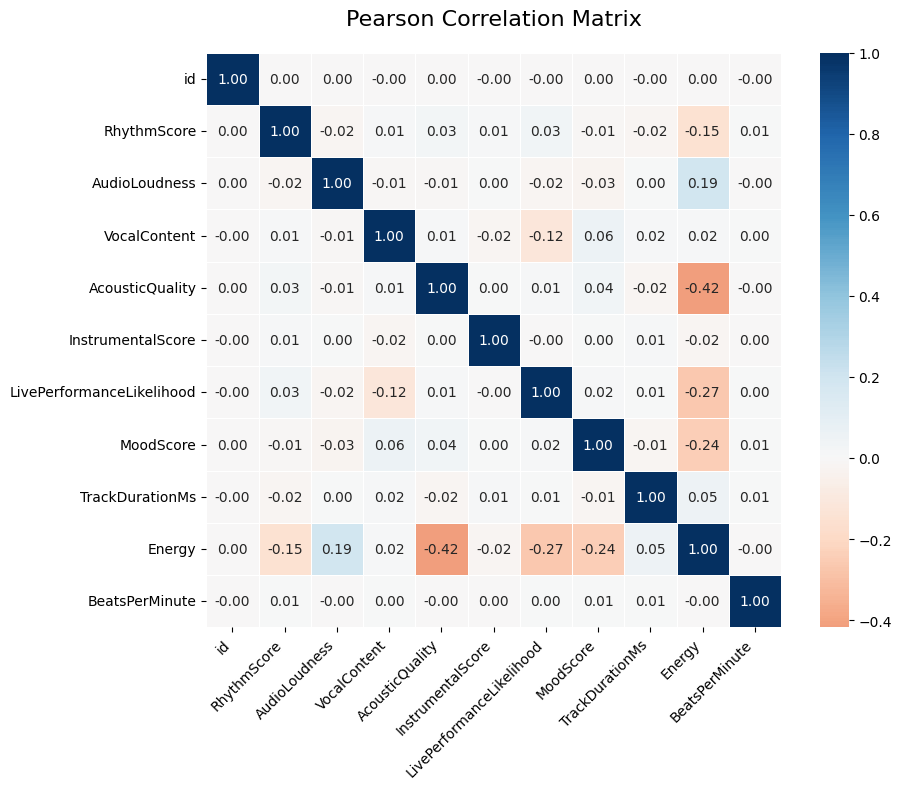

In [13]:
plt.close() 
plt.figure(figsize=(10, 8))
heatmap = sns.heatmap(df_train.corr(method='pearson'), annot=True, fmt='.2f', cmap='RdBu', center=0, square=True, linewidths=0.5)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.title('Pearson Correlation Matrix', fontsize=16, pad=20)
plt.tight_layout()
plt.show()

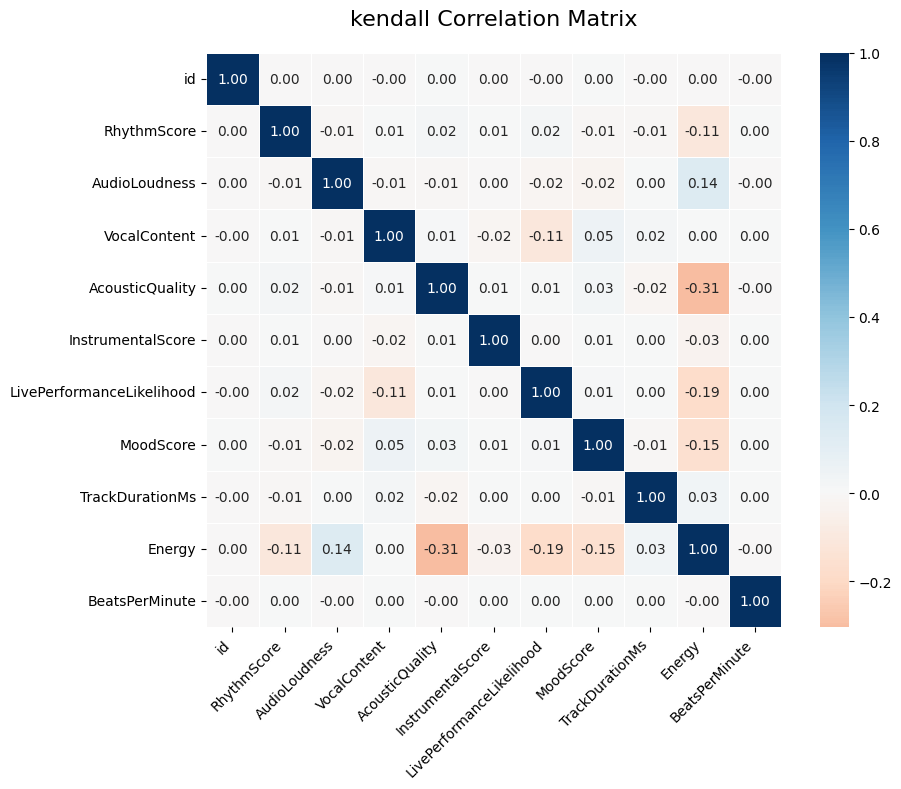

In [14]:
plt.close() 
plt.figure(figsize=(10, 8))
heatmap = sns.heatmap(df_train.corr(method='kendall'), annot=True, fmt='.2f', cmap='RdBu', center=0, square=True, linewidths=0.5)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.title('kendall Correlation Matrix', fontsize=16, pad=20)
plt.tight_layout()
plt.show()

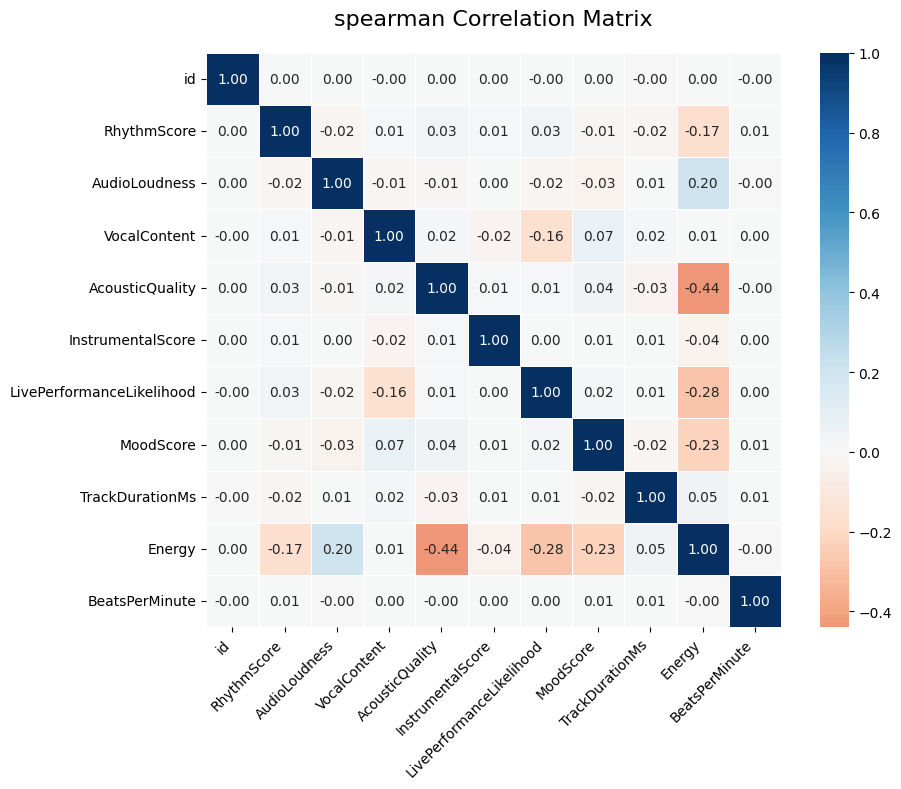

In [15]:
plt.close() 
plt.figure(figsize=(10, 8))
heatmap = sns.heatmap(df_train.corr(method='spearman'), annot=True, fmt='.2f', cmap='RdBu', center=0, square=True, linewidths=0.5)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.title('spearman Correlation Matrix', fontsize=16, pad=20)
plt.tight_layout()
plt.show()

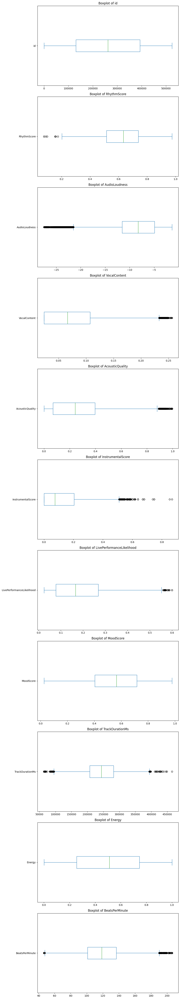

In [16]:
fig, axes = plt.subplots(nrows=len(df_train.columns), ncols=1, figsize=(10, 5*len(df_train.columns)))

# Plota cada coluna em um subplot separado
for i, col in enumerate(df_train.columns):
    df_train[col].plot.box(ax=axes[i], vert=False)
    axes[i].set_title(f'Boxplot of {col}')
    
plt.tight_layout()
plt.show()

In [17]:
def add_outlier_flags(df, cols=None, k=1.5):
    """
    Add flag columns when outliers are detected using IQR method.
    
    Parameters
    ----------
    df : pd.DataFrame
        Input Dataframe.
    cols : list (default=None)
        List of numerical columns to be evalueted. If None, uses all numerical columns.
    k : float (default=1.5)
        IQR multiplicator to define outlier limits.
    
    Return
    -------
    df : pd.DataFrame
        DataFrame with extra columns is_outlier_<col>.
    """
    
    if cols is None:
        cols = df.select_dtypes(include="number").columns
    
    for col in cols:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower = Q1 - k * IQR
        upper = Q3 + k * IQR
        
        flag_col = f"is_outlier_{col}"
        df[flag_col] = ((df[col] < lower) | (df[col] > upper)).astype(int)
    
    return df


In [18]:
df_train = add_outlier_flags(df_train, ['RhythmScore','AudioLoudness','VocalContent','AcousticQuality','InstrumentalScore','LivePerformanceLikelihood','TrackDurationMs'])

In [19]:
# Feature Engineering
# Vocal Instrumental Ratio its based on the assumption that instrumental songs may be more constant and have lower BPM, while songs with vocals may have more changes in the structure to acomodate the singing, hence, possibly higher BPM
df_train['vocal_instrumental_ratio'] = df_train['VocalContent'] / (df_train['InstrumentalScore'] + 1e-5)
#Energy and Rhythm Interaction its based on the assumption that both energy and rhythmscore may be present in songs with higher BPM, so, when combined in a multiplication, their combined value should be high enough to distance itself apart from slower songs
df_train['energy_rhythm_interaction'] = df_train['Energy'] * df_train['RhythmScore']
# MoodsScore was splited because its a measurement of emotion, hence, it feels right to create a categorical feature based on that
df_train['MoodScore_bins'] = pd.qcut(df_train["MoodScore"], q=3, labels=['low','medium','high'])

In [20]:
profile = ProfileReport(df_train, title="Profiling Report")

In [21]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 21/21 [00:12<00:00,  1.73it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [22]:
df_train

,id,RhythmScore,AudioLoudness,VocalContent,AcousticQuality,InstrumentalScore,LivePerformanceLikelihood,MoodScore,TrackDurationMs,Energy,...,is_outlier_RhythmScore,is_outlier_AudioLoudness,is_outlier_VocalContent,is_outlier_AcousticQuality,is_outlier_InstrumentalScore,is_outlier_LivePerformanceLikelihood,is_outlier_TrackDurationMs,vocal_instrumental_ratio,energy_rhythm_interaction,MoodScore_bins
0,0,0.603610,-7.636942,0.023500,0.000005,0.000001,0.051385,0.409866,290715.6450,0.826267,...,0,0,0,0,0,0,0,2122.854562,0.498743,low
1,1,0.639451,-16.267598,0.071520,0.444929,0.349414,0.170522,0.651010,164519.5174,0.145400,...,0,0,0,0,0,0,0,0.204678,0.092976,medium
2,2,0.514538,-15.953575,0.110715,0.173699,0.453814,0.029576,0.423865,174495.5667,0.624667,...,0,0,0,0,0,0,0,0.243959,0.321415,low
3,3,0.734463,-1.357000,0.052965,0.001651,0.159717,0.086366,0.278745,225567.4651,0.487467,...,0,0,0,0,0,0,0,0.331594,0.358026,low
4,4,0.532968,-13.056437,0.023500,0.068687,0.000001,0.331345,0.477769,213960.6789,0.947333,...,0,0,0,0,0,0,0,2122.854562,0.504899,medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
524159,524159,0.796831,-13.405645,0.023500,0.504738,0.000001,0.191414,0.668079,135528.3189,0.004400,...,0,0,0,0,0,0,0,2122.854562,0.003506,high
524160,524160,0.975000,-12.132914,0.077379,0.069462,0.262320,0.124818,0.288946,240709.3918,0.447067,...,0,0,0,0,0,0,0,0.294969,0.435890,low
524161,524161,0.542958,-1.357000,0.071390,0.168978,0.000001,0.313912,0.586868,344858.2321,0.718800,...,0,0,0,0,0,0,0,6448.916260,0.390278,medium
524162,524162,0.637192,-7.411331,0.113086,0.000005,0.061946,0.287963,0.368891,322710.3187,0.944267,...,0,0,0,0,0,0,0,1.825263,0.601679,low


In [23]:
# Test skewness in TrackDurationMs, since songs tend to have at least 3 minutes,hence, there is a good chance that this feature distribution is skewed to the right
df_train['TrackDurationMs'].skew()
# The value sugests that the distribution its basically symmetric.

np.float64(-0.19048287149792312)

In [24]:
df_train['TrackDurationMs'].kurt()

np.float64(-0.12915354512012156)

In [25]:
#Now i believe i have enough information to start preprocessing. The functions that do preprocessing will be found in src/preprocessing.py

#### 1- What is the problem that needs to be solved?
##### I have a dataset with simulated data, based on a real dataset about BPM Prediction. The challenge is to predict BeatsPerMinute using the other features.
#### 2- What the features mean?
##### Ideally, the challenge would have a discription of each feature. Sadly, that's not the case with this dataset. Hence, a bit of interpretation and inference will be needed.
|Feature|Description|
|-------|-----------|
|id (integer)| primary key|
|RhythmScore (float)|probably measures how consistent is the rhythmic pattern. Higher values indicate more consistency|
|AudioLoudness (float)|in dB scale. The closer to 0 the higher the volume. Its in negative scale because its common to measure loudness relative to full scale|
|VocalContent (float)|proportion of vocals in the song|
|AcousticQuality (float)|indicates how acoustic (vs eletronic) the song is|
|InstrumentalScore (float)|same as VocalContent, but in regards to instruments besides vocals|
|LivePerformanceLikelihood (float)|the likelihood of the audio to be a live performance|
|MoodScore (float)|probably related to how "happy" or "sad" the song sounds. Higher values probably mean "happier" songs|
|TrackDurationMs (float)|track duration in miliseconds|
|Energy (float)|indicates intensity|
|BeatsPerMinute (float)|target variable, regression problem, since it is a continuous one|
#### 3-What are the data sorts (numerical, categorical, textual content, etc.)?
##### Everything is numerical, continuous. The data types were specified in the previous question.
#### 4-Is there any previously known information on troubles or obstacles?
##### Not that i know of.
#### 5-Are there any relevant area-unique issues or constraints?
##### Most of the data is already standardized. AudioLoudness is in a dB scale relative to full scale, hence, its negative values. TrackDurationMs and AudioLoudness may need standardization. 
##### Also, most features don't correlate to each other, with the exception of a somewhat significant negative correlation between Energy and AcousticQuality (pearson, spearman and kendal).
##### Besides, most of the columns are already standardized, and the data itself is syntetical, hence, most of the data that looks like outliers are probably not.

References:
<br>
https://towardsdatascience.com/a-data-scientists-essential-guide-to-exploratory-data-analysis-25637eee0cf6/
<br>
https://www.kaggle.com/competitions/playground-series-s5e9/overview
<br>
https://www.youtube.com/watch?v=FNLLxYcUnow
<br>
https://medium.com/dataseries/an-eda-checklist-800beeaee555
<br>
https://www.machinelearningplus.com/machine-learning/missing-data-imputation-how-to-handle-missing-values-in-python/
<br>
https://towardsdatascience.com/a-data-scientists-essential-guide-to-exploratory-data-analysis-25637eee0cf6/
<br>
https://www.geeksforgeeks.org/data-analysis/steps-for-mastering-exploratory-data-analysis-eda-steps/
